In [1]:
import matplotlib.pyplot as plt
import sys
sys.path.insert(0, "../src")
from dbapi import PostgresDataHandler # Import the PostgresDataHandler class
from dotenv import load_dotenv # To load environment variables from a .env file
import os 
import pandas as pd

In [2]:
# Load the .env file
load_dotenv()

# Read environment variables
user = os.getenv("POSTGRES_USER")
password = os.getenv("POSTGRES_PASSWORD")
host = os.getenv("POSTGRES_HOST")
port = os.getenv("POSTGRES_PORT")
db_name = os.getenv("POSTGRES_DB")

# Construct the DB URI
db_uri = f"postgresql://{user}:{password}@{host}:{port}/{db_name}" 

# Create the PostgresDataHandler instance
handler = PostgresDataHandler(db_uri) # Initialize the data handler with the DB URI

In [3]:
prices = handler.get_data(date="2025-04-15", lookback=2000, columns = ['close'])

In [4]:
# Ensure prices.index is datetime, timezone-naive, and normalized
prices.index = pd.to_datetime(prices.index).tz_localize(None).normalize()

In [5]:
window = 14  # How many days to look back

# 1. Compute daily price change (absolute not percent)
daily_change = prices.diff().abs()

# 2. Rolling std of price change → how “compressed” is the price movement
compression = daily_change.rolling(window=window, min_periods=3).std()

# 3. Invert to score tight price action as higher signal
compression_factor = 1 / (compression)

# 4. Stack for Alphalens
factor = compression_factor.stack(dropna=True)
factor.name = "factor_price_compression"

/tmp/ipykernel_236619/4183595994.py:15: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  factor = compression_factor.stack(dropna=True)


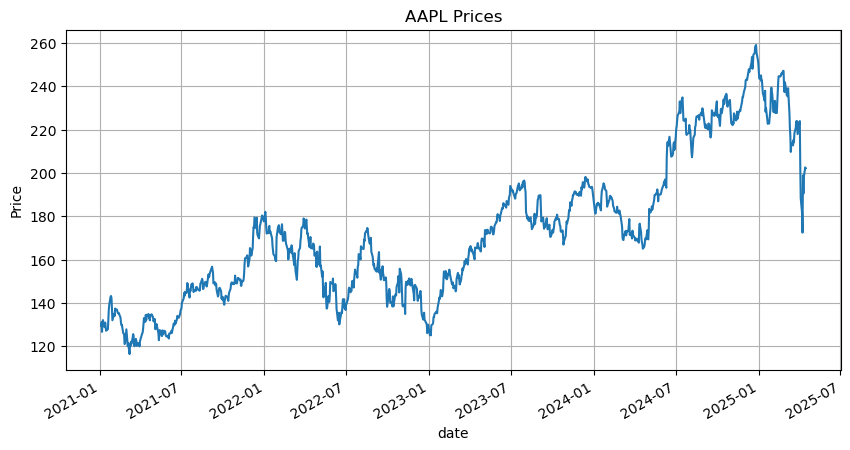

In [6]:
prices['AAPL'].plot(title="AAPL Prices", ylabel="Price", figsize=(10, 5))
plt.grid(True)
plt.show()

In [7]:
# Clean factor index (ensure tz-naive)
factor.index = pd.MultiIndex.from_tuples(
    [(pd.to_datetime(d).tz_localize(None), t) for d, t in factor.index],
    names=["date", "ticker"]
)

prices = prices.iloc[3:]

In [8]:
prices

ticker,A,AA,AAL,AAOI,AAON,AAP,AAPL,AAT,AB,ABBV,...,ZI,ZION,ZLAB,ZM,ZNTL,ZS,ZTS,ZUMZ,ZYME,ZYXI
date,,,,,,,,,,,,,,,,,,,,,
2021-01-07,126.16,25.23,15.38,9.64,46.980000,167.67,130.92,28.18,34.97,106.71,...,44.00,49.99,139.82,342.50,49.43,193.05,167.00,39.39,53.54,13.800000
2021-01-08,127.06,24.99,15.13,10.19,46.206667,170.06,132.05,28.22,34.89,107.27,...,45.57,48.72,145.84,349.61,49.57,197.37,168.11,40.04,56.81,13.218182
2021-01-11,128.15,24.56,15.00,10.28,46.246667,171.02,128.98,27.87,35.07,109.02,...,44.01,49.87,148.23,337.71,48.45,198.70,169.39,42.65,56.25,12.318182
2021-01-12,126.97,25.08,15.38,10.40,47.573333,176.67,128.80,28.16,35.90,109.78,...,44.01,50.36,151.32,356.81,49.41,205.90,166.12,43.58,54.00,13.063636
2021-01-13,126.98,24.44,15.53,10.17,46.713333,171.76,130.89,28.47,35.93,112.45,...,45.02,49.79,153.65,364.63,50.51,207.08,161.95,43.70,52.95,13.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-09,107.05,25.86,11.12,13.87,82.220000,33.47,198.85,18.53,35.90,179.84,...,8.56,45.73,27.06,71.83,1.17,202.12,153.55,14.04,10.00,2.350000
2025-04-10,99.95,23.75,9.51,11.72,80.420000,32.17,190.42,17.95,35.71,174.20,...,7.84,42.47,24.32,69.61,1.13,195.36,147.00,13.52,9.44,2.150000
2025-04-11,102.71,24.75,9.67,11.28,84.160000,32.26,198.15,18.30,37.36,175.05,...,7.93,42.00,29.54,71.34,1.23,198.08,149.44,13.38,10.63,2.185000


In [9]:
factor

date        ticker
2021-01-07  A          0.751427
            AA         1.269183
            AAL        9.116057
            AAOI       3.036817
            AAON       1.083181
                        ...    
2025-04-15  ZS         0.142759
            ZTS        0.393510
            ZUMZ       1.868745
            ZYME       3.218683
            ZYXI      10.419500
Name: factor_price_compression, Length: 2757610, dtype: float64

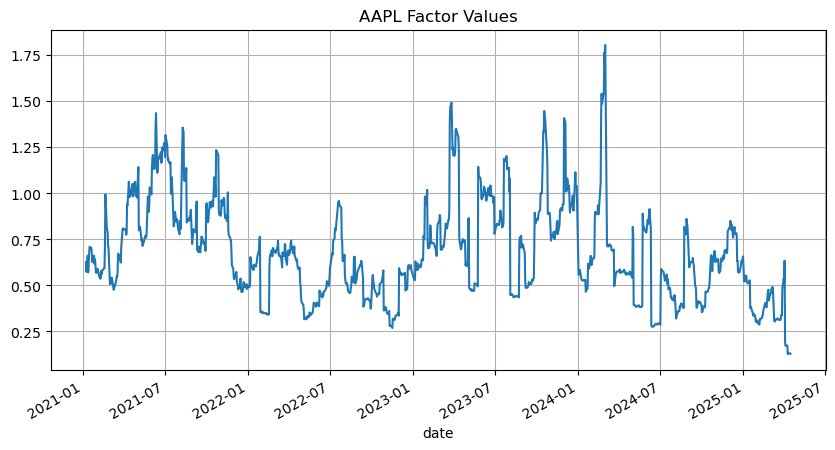

In [10]:
aapl_values = factor.loc[(slice(None), 'AAPL')].sort_index()
aapl_values.plot(title="AAPL Factor Values", figsize=(10, 5))
plt.grid(True)
plt.show()

In [11]:
groups = handler.get_sic_codes()

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,1.452495e-07,7.599365e-01,2.905133e-01,1.569134e-01,306020,11.128898
2,2.388718e-01,1.342200e+00,7.060351e-01,1.796757e-01,304950,11.089986
3,4.451726e-01,2.041295e+00,1.134047e+00,2.583741e-01,305927,11.125516
4,7.396878e-01,2.904611e+00,1.653407e+00,3.601632e-01,305033,11.093005
5,1.209971e+00,4.048444e+00,2.329579e+00,5.197345e-01,305918,11.125189
6,1.679776e+00,5.970463e+00,3.314870e+00,8.048194e-01,304964,11.090495
7,2.264768e+00,9.931480e+00,4.935598e+00,1.349243e+00,305996,11.128026
8,3.171562e+00,2.032825e+01,8.214648e+00,2.768988e+00,304950,11.089986
9,5.043381e+00,7.770170e+15,2.544065e+10,1.404612e+13,306020,11.128898


Returns Analysis


,1D,2D,3D
Ann. alpha,0.168,0.182,0.187
beta,-0.035,0.003,0.023
Mean Period Wise Return Top Quantile (bps),7.503,8.211,8.482
Mean Period Wise Return Bottom Quantile (bps),-7.112,-7.151,-6.986
Mean Period Wise Spread (bps),14.615,15.354,15.450


<Figure size 640x480 with 0 Axes>

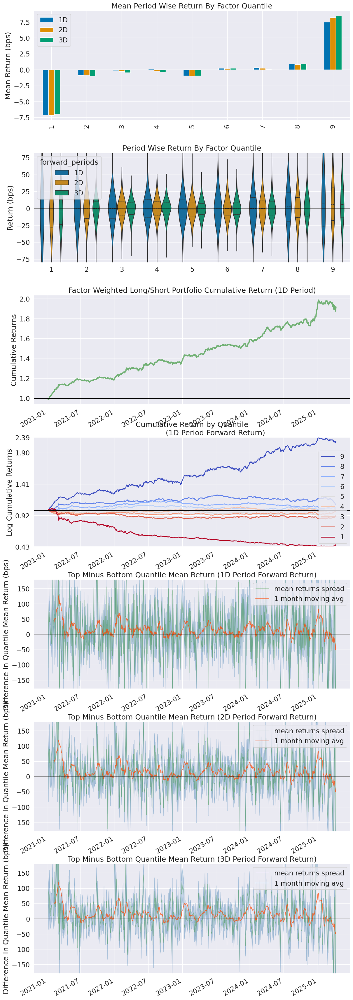

/home/caden/anaconda3/envs/alphactorydb/lib/python3.11/site-packages/alphalens/performance.py:520: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_stats = mean_ret.groupby(grouper).agg(["mean", "std", "count"])
/home/caden/anaconda3/envs/alphactorydb/lib/python3.11/site-packages/alphalens/plotting.py:422: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for a, (sc, cor) in zip(ax, mean_ret_by_q.groupby(level="group")):


Information Analysis


,1D,2D,3D
IC Mean,-0.011,-0.012,-0.012
IC Std.,0.095,0.098,0.100
Risk-Adjusted IC,-0.116,-0.121,-0.119
t-stat(IC),-3.796,-3.950,-3.909
p-value(IC),0.000,0.000,0.000
IC Skew,0.090,0.124,0.198
IC Kurtosis,0.218,0.340,0.449


/home/caden/anaconda3/envs/alphactorydb/lib/python3.11/site-packages/alphalens/performance.py:57: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  lambda x: stats.spearmanr(x, f)[0]
/home/caden/anaconda3/envs/alphactorydb/lib/python3.11/site-packages/alphalens/performance.py:126: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ic = ic.reset_index().set_index("date").groupby(grouper).mean()


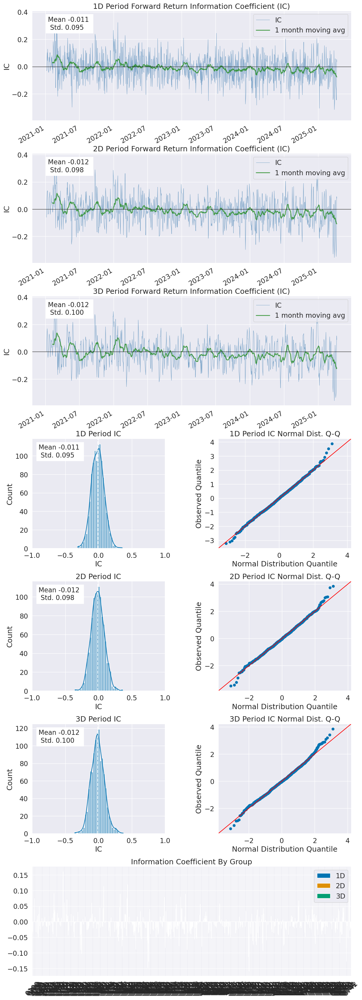

/home/caden/anaconda3/envs/alphactorydb/lib/python3.11/site-packages/alphalens/utils.py:928: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,1D,2D,3D
Quantile 1 Mean Turnover,0.045,0.076,0.102
Quantile 2 Mean Turnover,0.109,0.179,0.236
Quantile 3 Mean Turnover,0.146,0.234,0.305
Quantile 4 Mean Turnover,0.168,0.266,0.343
Quantile 5 Mean Turnover,0.177,0.279,0.356
Quantile 6 Mean Turnover,0.172,0.272,0.348
Quantile 7 Mean Turnover,0.154,0.245,0.316
Quantile 8 Mean Turnover,0.122,0.197,0.256
Quantile 9 Mean Turnover,0.051,0.084,0.111


,1D,2D,3D
Mean Factor Rank Autocorrelation,0.992,0.983,0.974


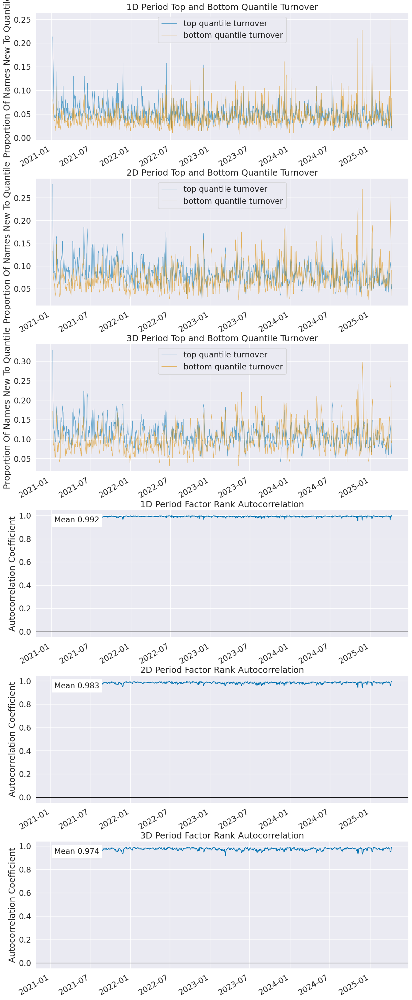

In [12]:
import alphalens as al

factor_data = al.utils.get_clean_factor_and_forward_returns(
    factor=factor,
    prices=prices,
    groupby = groups,
    quantiles=9,
    periods=(1, 2, 3,)
)

al.tears.create_full_tear_sheet(factor_data, by_group=True)

In [14]:
import alphalens.performance as alperf

# Compute mean returns by quantile
mean_ret, std_err = alperf.mean_return_by_quantile(factor_data)

# Calculate the spread between top and bottom quantiles for the 1D period
spread_actual = (mean_ret.loc[5, '1D'] - mean_ret.loc[1, '1D']) * 10000  # Convert to basis points


In [ ]:
import alphalens.utils as alutils
import contextlib

num_trials = 1000
mean_spreads_random = []

# Path to null device (discard output)
NULL = open(os.devnull, 'w')

for _ in tqdm(range(num_trials), desc="Running Permutation Test"):
     # Permute factor within each day
    shuffled_factor = factor.groupby(level='date').transform(np.random.permutation)

    with contextlib.redirect_stdout(NULL):  # suppress stdout
        factor_data_shuffled = alutils.get_clean_factor_and_forward_returns(
            factor=shuffled_factor,
            prices=prices,
            groupby=groups,
            quantiles=5,
            periods=(1, 5, 10)
        )

    # Compute mean returns by quantile
    mean_ret_shuffled, _ = alperf.mean_return_by_quantile(factor_data_shuffled)

    # Calculate the spread between top and bottom quantiles for the 1D period
    spread_bps = (mean_ret_shuffled.loc[5, '1D'] - mean_ret_shuffled.loc[1, '1D']) * 10000
    mean_spreads_random.append(spread_bps)


Running Permutation Test:  29%|███████████████████▉                                                | 293/1000 [14:37<36:04,  3.06s/it]

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(mean_spreads_random, bins=50, alpha=0.7, label="Permuted Spreads")
plt.axvline(spread_actual, color='red', linestyle='--', linewidth=2, label=f"Actual Spread = {spread_actual:.2f} bps")

plt.title("Monte Carlo Permutation Test: Spread Between Quantiles")
plt.xlabel("Mean Return Spread (bps)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()